In [1]:
import pandas as pd
import numpy as np
import scanpy as sc

In [2]:
sc.logging.print_versions()

scanpy==1.4.2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.3.1 pandas==0.25.2 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1 


In [3]:
#Import Seurat single cell matrix (integrated) in Scanpy: 
adata = sc.read('./Final_umap_nature/Placenta.integrated_counts.mtx').T  # transpose the data
adata.var_names = pd.read_csv('./Final_umap_nature/Placenta.integrated.genes.txt', header=None, sep='\n')[0]
adata.obs_names = pd.read_csv('./Final_umap_nature/Placenta.integrated.cell_barcodes.txt', header=None)[0]

In [4]:
#Read the updated metadata: after C14, C15 & C28 split (done on: 11.02.2021)
#Add metadata to the anndata object in scanpy like this: 
df_annotations = pd.read_csv("./Final_umap_nature/Placenta.metadata.csv",header=0,index_col=[0])
adata.obs = df_annotations

In [6]:
#Read the PCA coordinates of the cells (exported from Seurat)
pca_coord= pd.read_csv("./Final_umap_nature/Seurat_PCA_embeddings_final.csv", index_col= "barcode")
pca_coord.head()

,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,PC_10,...,PC_26,PC_27,PC_28,PC_29,PC_30,PC_31,PC_32,PC_33,PC_34,PC_35
barcode,,,,,,,,,,,,,,,,,,,,,
VL_AAACCTGAGATCCCGC-1_1,-9.227176,2.077697,-4.032164,1.392073,1.461481,-0.558655,-0.471354,0.539374,0.612526,-0.643816,...,1.690653,4.417500,3.489827,1.186705,0.120480,-2.488129,-1.182454,-0.187728,-0.700116,1.801414
VL_AAACCTGAGGACAGAA-1_1,-11.394138,-23.864798,-3.749596,-6.067019,-6.533756,0.734442,0.254717,0.037690,0.075277,-0.716279,...,-2.183334,-5.879420,-3.225595,-0.920598,0.547214,0.295685,-0.613896,-10.974807,3.054750,-3.095948
VL_AAACCTGAGGCTAGGT-1_1,-13.946086,-29.007449,-6.996135,-11.312377,-13.509170,-2.205107,-0.143177,-0.360961,0.248786,0.809249,...,-1.213047,-4.804991,-3.400408,-2.125711,1.427201,-2.606519,-0.907450,-0.494544,-0.258121,1.677775
VL_AAACCTGCAAGCGAGT-1_1,-3.399152,-21.442873,7.228384,-4.544619,27.297748,8.231183,11.237246,-18.155748,-15.906060,-5.822499,...,2.462750,2.273560,0.410714,-0.393373,0.964854,-0.108792,-0.141945,0.563206,0.621862,-1.684377
VL_AAACCTGCAATCACAC-1_1,-11.056286,6.646960,-6.099391,3.278611,3.642518,-3.893588,-0.775189,1.273839,0.068501,-0.071453,...,-1.486320,0.566150,0.753944,1.046128,-0.700403,0.394658,0.261062,-1.528099,-0.132179,-1.973555


In [7]:
adata.obsm["X_pca"]= pca_coord.values

adata.obsm["X_pca"]

array([[ -9.22717616,   2.07769702,  -4.03216409, ...,  -0.18772808,
         -0.700116  ,   1.80141374],
       [-11.39413778, -23.86479798,  -3.74959592, ..., -10.97480718,
          3.05475008,  -3.09594818],
       [-13.94608558, -29.00744882,  -6.99613461, ...,  -0.49454445,
         -0.25812055,   1.67777462],
       ...,
       [ 13.32022245,  -1.59767367,   4.56239362, ...,   2.4403395 ,
         -1.17824963,   0.60922147],
       [ 20.81169538,  -2.21596707,   7.25089925, ...,   3.82001158,
          6.42005075,   1.58481055],
       [  8.83119502,   2.034716  ,  10.33694362, ...,  -0.95819437,
         -5.13449348,  -0.6468919 ]])

In [15]:
adata_int= adata.copy() 

sc.pp.neighbors(adata_int, n_pcs=30)


#Compute UMAP using "umap-learn" python version & a specific seed value to ensure reproducibility: 
#Seurat: min.dist = 0.3; spread=1, repulsion.strength/alpha=1. 
sc.tl.umap(adata_int, min_dist=0.3, spread=1.0, n_components=2, maxiter=None, alpha=1.0, 
        gamma=1.0, negative_sample_rate=5, init_pos='spectral', random_state=40)

/home/debnatho/anaconda3/envs/hca_pancreas_paga/lib/python3.6/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../home/debnatho/anaconda3/envs/hca_pancreas_paga/lib/python3.6/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))
/home/debnatho/anaconda3/envs/hca_pancreas_paga/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


In [9]:
adata_int 

AnnData object with n_obs × n_vars = 101031 × 4311 
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'stim', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.5', 'seurat_clusters', 'group', 'disease', 'time', 'tissue', 'tissue_time', 'integrated_snn_res.1', 'integrated_snn_res.2', 'integrated_snn_res.3', 'cell_type', 'RNA_snn_res.0.8', 'Merged_cell_type_PC35', 'cell_type_merged', 'sub_cluster', 'sub_cluster_final', 'cell_type_semifinal'
    uns: 'neighbors'
    obsm: 'X_pca', 'X_umap'

In [10]:
#Read the Seurat data (normalized) again:
adata_norm= sc.read_h5ad("./Final_umap_nature/Placenta_normalized_Seurat_markers.h5ad")

adata_norm.obs['cell_type_semifinal_v2'].cat.categories

Index(['DSC_1', 'DSC_2', 'Unclassified_35', 'dDC', 'dEVT', 'dEpC', 'dFB_1',
       'dFB_2', 'dGranulocyte', 'dLEC', 'dLEC_dysfunctional', 'dMAC_activated',
       'dMAC_classical', 'dMSC', 'dMonocyte', 'dNK_1', 'dNK_2', 'dNK_prol',
       'dPlasmaCell', 'dSCT', 'dSMC', 'dTcell', 'dVEC', 'vBcell', 'vDC', 'vEB',
       'vEVT', 'vFB', 'vHBC', 'vMC', 'vSCT_1', 'vSCT_2', 'vTSC', 'vTcell',
       'vVCT', 'vVCT_prol', 'vVEC', 'vtropho_15'],
      dtype='object')

In [16]:
#Transfer the latest annotations to adata_int (integrated).
adata_int.obs['cell_type_semifinal_v2']= adata_norm.obs['cell_type_semifinal_v2']

In [13]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (5,4)

sc.settings.set_figure_params(dpi_save=800, dpi=400)

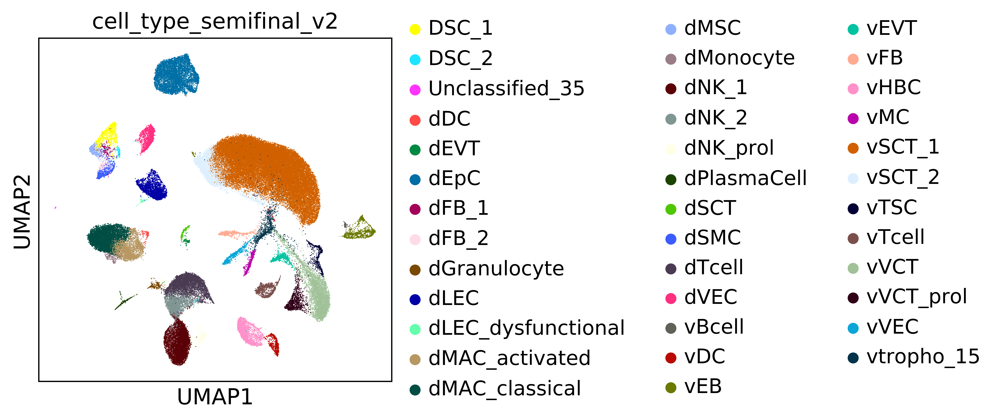

In [18]:
sc.pl.umap(adata_int, color= ['cell_type_semifinal_v2'])

In [19]:
adata_int.obs['cell_type_semifinal_v2'].cat.categories #Unclassified_35 is removed later since it's most likely a doublet. 

Index(['DSC_1', 'DSC_2', 'Unclassified_35', 'dDC', 'dEVT', 'dEpC', 'dFB_1',
       'dFB_2', 'dGranulocyte', 'dLEC', 'dLEC_dysfunctional', 'dMAC_activated',
       'dMAC_classical', 'dMSC', 'dMonocyte', 'dNK_1', 'dNK_2', 'dNK_prol',
       'dPlasmaCell', 'dSCT', 'dSMC', 'dTcell', 'dVEC', 'vBcell', 'vDC', 'vEB',
       'vEVT', 'vFB', 'vHBC', 'vMC', 'vSCT_1', 'vSCT_2', 'vTSC', 'vTcell',
       'vVCT', 'vVCT_prol', 'vVEC', 'vtropho_15'],
      dtype='object')

In [21]:
adata_int.uns['cell_type_semifinal_v2_colors']= ["#56CBF9", "#7C0B2B", "#A14A76", "#FFF44F", "#713E5A", "#CA6680", "#BF3100",
                                            "#D76A03", "#EC9F05", "#BFFF80",  "#8EA604", "#998650", "#E01A4F", "#C0C999",
                                            "#7A9CC6", "#BDE4A7", "#009900", "#7D8CC4", "#EAC5D8", "#FB4B4E", "#0B1D51",
                                            "#646881", "#F87060", "#048BA8", "#C0C999", "#E60000", "#5C7AFF", "#DEC1FF", 
                                             "#FE6776", "#63264A", "#FF99CC", "#FF0080", "#FF0000", "#A799B7",  
                                             "#00B3B3", "#004D4D", "#FD96A9", "#CC33FF"]

In [22]:
sc.settings.set_figure_params(dpi=150)

#sc.pl.umap(adata_int, color= ['cell_type_semifinal_v2'])

saving figure to file ./figures/umap_placenta_manuscript_1304.pdf


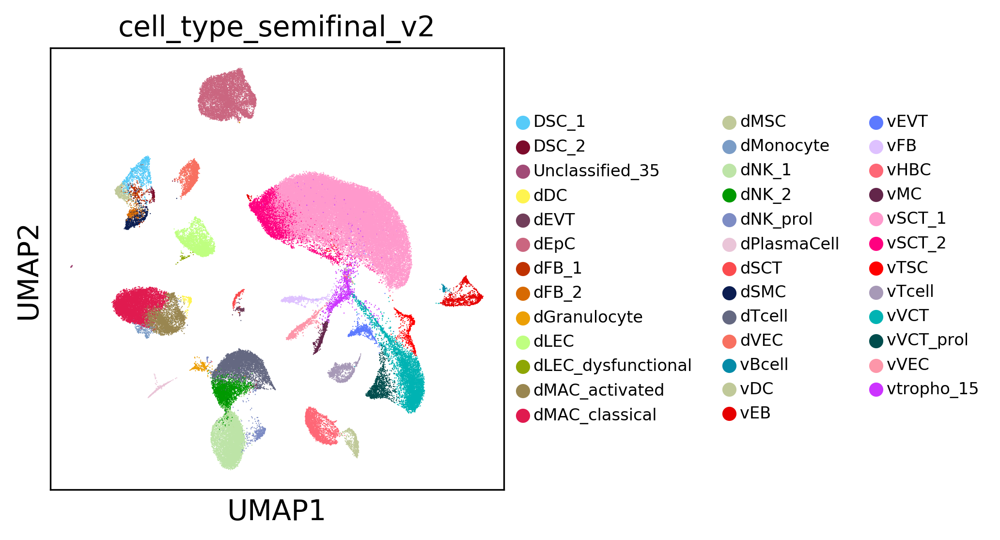

In [25]:
#Main figure 1B: Embedding (visualize using UMAP)
sc.pl.umap(adata_int, color= ['cell_type_semifinal_v2'], legend_fontsize= 'xx-small', 
           legend_fontweight= 'light', 
           save= '_placenta_manuscript_1304.pdf')

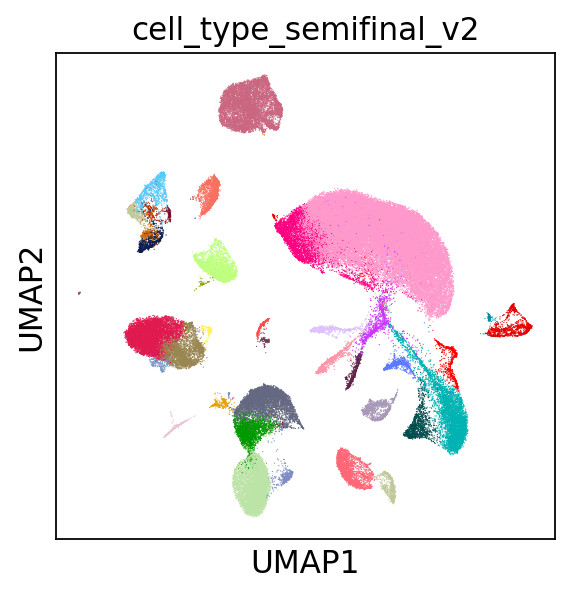

In [27]:
sc.settings.set_figure_params(dpi=80)

sc.pl.umap(adata_int, color= ['cell_type_semifinal_v2'], legend_loc=None)

/home/debnatho/anaconda3/envs/hca_pancreas_paga/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


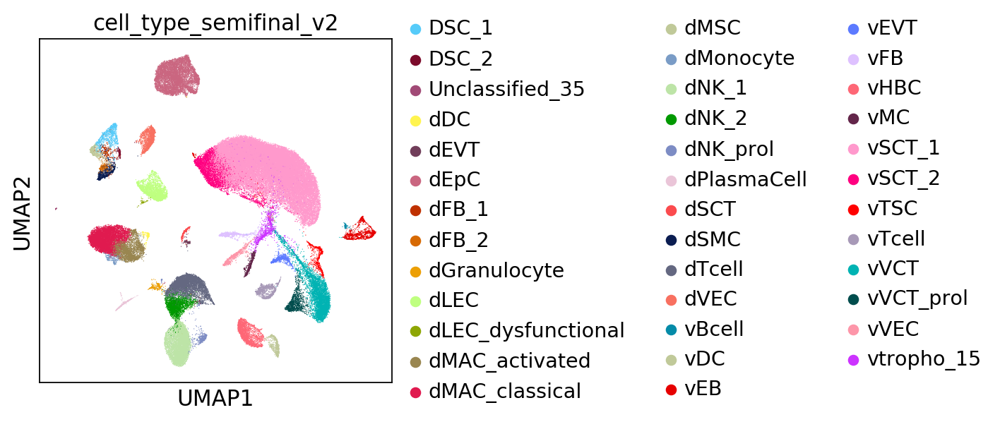

In [28]:
adata_umap= adata_int.copy() 

#Check reproducibility of the embedding (UMAP): perfect! 
sc.tl.umap(adata_umap, min_dist=0.3, spread=1.0, n_components=2, maxiter=None, alpha=1.0, 
        gamma=1.0, negative_sample_rate=5, init_pos='spectral', random_state=40)

sc.pl.umap(adata_umap, color= ['cell_type_semifinal_v2'])

In [29]:
#Calculate UMAP density: also, uploaded as a separate notebook. 
sc.tl.embedding_density(adata_int, basis='umap', groupby= 'group')

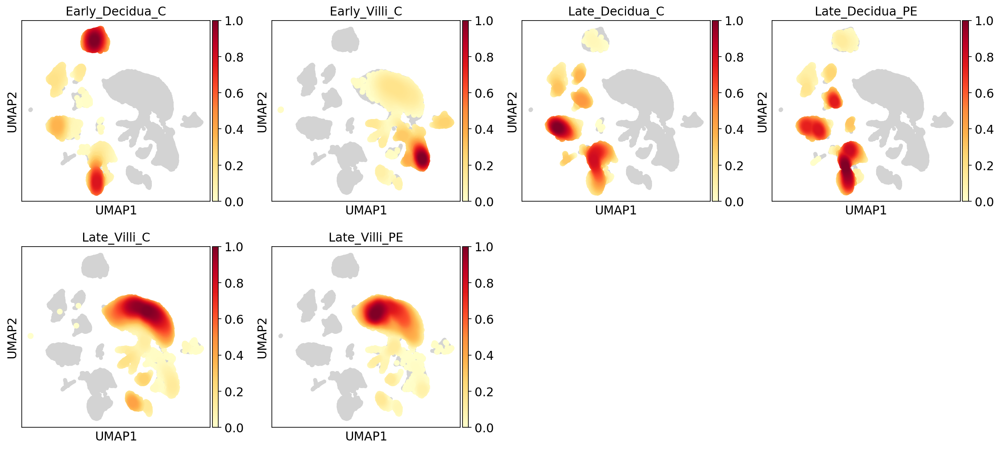

In [31]:
sc.pl.embedding_density(adata_int, basis='umap', key= 'umap_density_group') 

In [33]:
adata_norm_umap= adata_norm.copy() #Create a copy of the normalized data.

adata_norm_umap.obsm['X_umap']= adata_int.obsm['X_umap'] #transfer the UMAP coordinates from the integrated data.

PART-II: Internal validation of cell types (for reference)

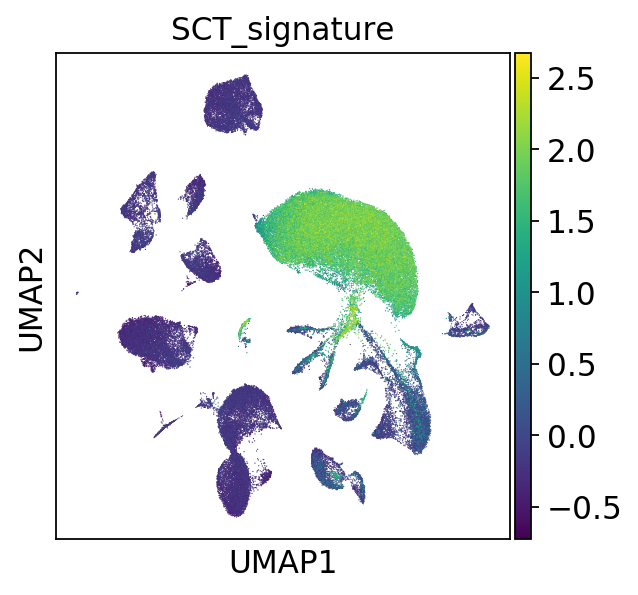

In [34]:
#Validation of "vSCTjuv" (vSCT_15.3 & vSCT_15.2 from Seurat): enrichment of SCT genes. 

#Compute a SCT module score: should be done on normalized data 
sct_genes= ['ADAM12', 'SVEP1', 'LINC01949', 'CHODL', 'PAPPA', 'PAPPA2', 'PSG11', 'PSG8', 'PSG1', 
                'KISS1', 'CGA', 'PGF', 'CYP19A1', 'KYNU', 'EBI3', 
                'CYP11A1', 'NECTIN3', 'BACE2', 'COBLL1', 'ATG9B', 'PSG9', 'EZR', 'EGFR', 
                'PSG5', 'DLG5', 'ZNF292', 'GULP1', 'ADGRL3', 'GATA2', 'JUND', 'AC090826.1', 
                'CSH1', 'CSH2', 'TFPI2', 'KRT18', 'KRT19', 'PSG3']

sc.tl.score_genes(adata_norm_umap, sct_genes, score_name= 'SCT_signature')

sc.pl.umap(adata_norm_umap, color= ['SCT_signature'])

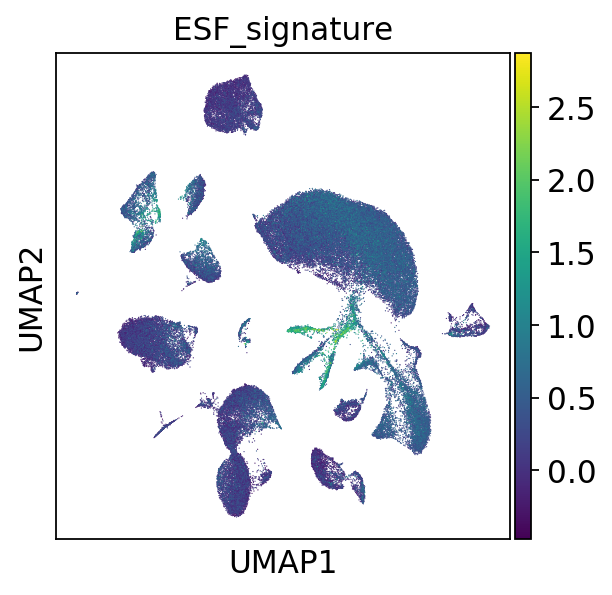

In [35]:
#Recompute a ESF (Endometrial stromal like) score: the idea stems from the fact a small subset of vSCTjuv is in close proximity 
#with the villi mesenchymal lineage clusters plus show the expression of certain stromal genes including paternally imprinted DLK1. 
#Prominent expression of DLK1 validates that the cluster we're seeing isn't a technical artifact.  
esf_genes= ['VIM', 'SPARC', 'DLK1', 'TMSB10', 'COL4A1', 'COL3A1', 'ACTB', 'IGFBP3', 'ALPP', 'FBLN1', 'MMP11', 'FBN2']

sc.tl.score_genes(adata_norm_umap, esf_genes, score_name= 'ESF_signature')

#Plot on latest UMAP: 
sc.pl.umap(adata_norm_umap, color= ['ESF_signature'])

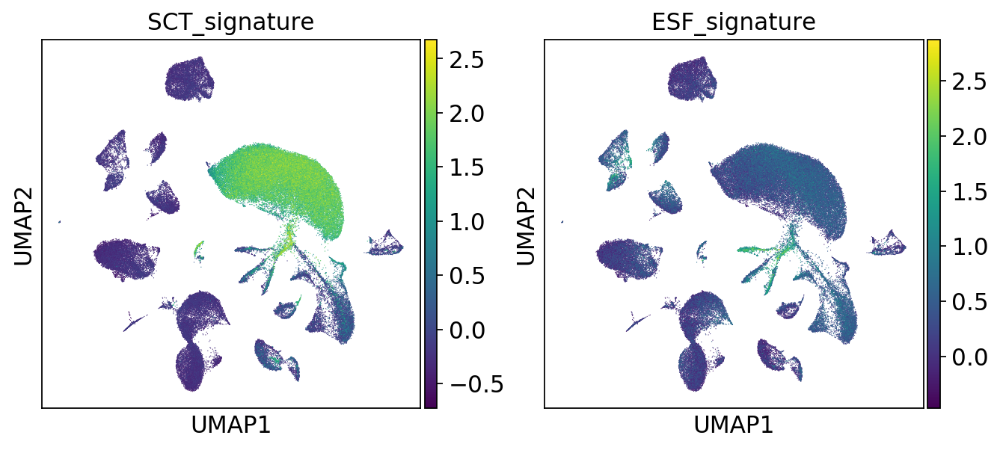

In [37]:
#Plot side by side: for internal validation
sc.pl.umap(adata_norm_umap, color= ['SCT_signature', 'ESF_signature'])

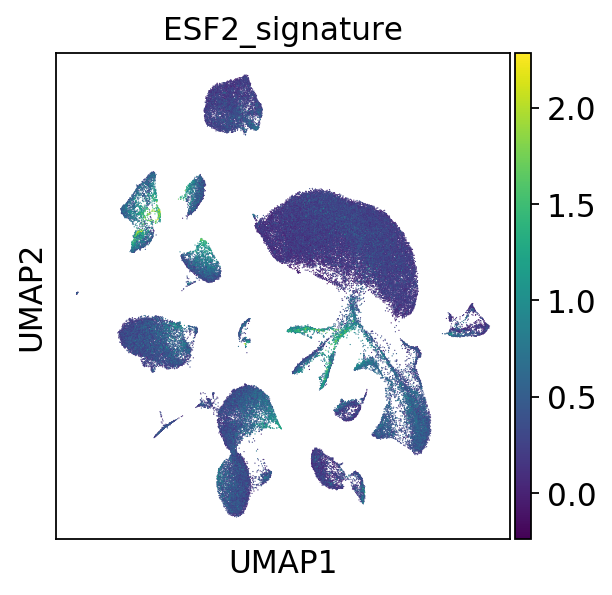

In [38]:
#Recompute the ESF score by adding few extra stromal genes:
esf_new= ['VIM', 'SPARC', 'DLK1', 'TMSB10', 'COL4A1', 'COL3A1', 'ACTB', 'IGFBP3', 'FBLN1', 'MMP11', 'FBN2',
         'TMSB4X', 'ANXA2', 'ACTB', 'B2M', 'ITGB1', 'COL1A1', 'THBS1', 'IGFBP5', 'CALM2', 'ACTG1', 'PTMA', 'TAGLN',
         'FSTL1', 'FTH1', 'S100A6', 'LGALS1', 'CCND1', 'TPM4', 'RND3', 'TPM1', 'RPL39', 'RPL41']

sc.tl.score_genes(adata_norm_umap, esf_new, score_name= 'ESF2_signature')

#Plot on latest UMAP: 
sc.pl.umap(adata_norm_umap, color= ['ESF2_signature'])

/home/debnatho/anaconda3/envs/hca_pancreas_paga/lib/python3.6/site-packages/anndata/core/anndata.py:846: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


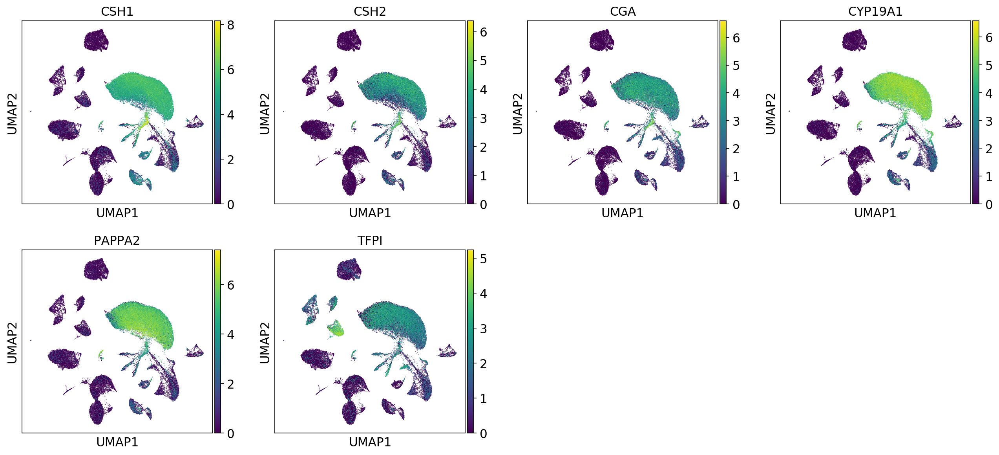

In [39]:
#Robust markers for vSCTjuv (mimics synctitiotrophoblast cells)
sc.pl.umap(adata_norm_umap, color= ['CSH1', 'CSH2', 'CGA', 'CYP19A1', 'PAPPA2', 'TFPI'])

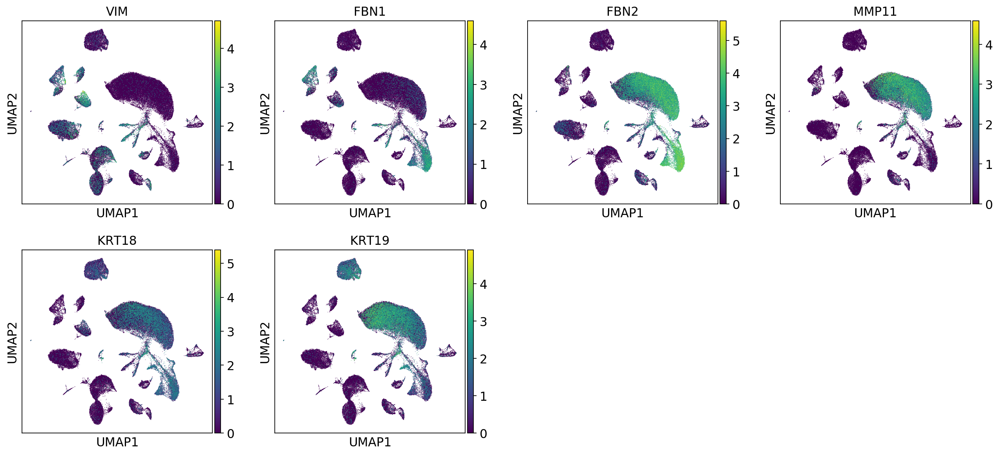

In [40]:
#Plot a few EMT genes: 
sc.pl.umap(adata_norm_umap, color= ['VIM', 'FBN1', 'FBN2', 'MMP11', 'KRT18', 'KRT19'])

In [41]:
#Subset villi cell types from the log-normalized anndata:
subset= ['vEVT', 'vFB', 'vMC', 'vSCT_1', 'vSCT_2', 'vTSC', 'vVCT', 'vVCT_prol', 'vVEC', 'vtropho_15']

adata_villi_norm= adata_norm[adata_norm.obs['cell_type_semifinal_v2'].isin(subset)]

adata_villi_norm

View of AnnData object with n_obs × n_vars = 54811 × 26115 
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'stim', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.5', 'seurat_clusters', 'group', 'disease', 'time', 'tissue', 'tissue_time', 'integrated_snn_res.1', 'integrated_snn_res.2', 'integrated_snn_res.3', 'cell_type', 'RNA_snn_res.0.8', 'Merged_cell_type_PC35', 'cell_type_merged', 'sub_cluster', 'sub_cluster_final', 'cell_type_semifinal', 'cell_type_semifinal_v2'
    uns: 'cell_type_semifinal_colors', 'umap_density_disease_params', 'umap_density_group_params', 'umap_density_params', 'umap_density_tissue_params'
    obsm: 'X_umap'

In [42]:
custom_genes= ['CSH1', 'CSH2', 'CYP19A1', 'PAPPA', 'PAPPA2', 'CGA', 'KISS1', 'TFPI', 'PGF', 'EBI3', 'KYNU', 'PSG9', 'PSG5', 'PSG11',
               'MMP11', 'FBN2', 'PLAC4', 'DLK1', 'IGFBP3', 'VIM', 
              'TMSB10', 'SPARC', 'FBLN1', 'COL4A1', 'COL3A1', 'ACTB']

         Falling back to preprocessing with `sc.pp.pca` and default params.


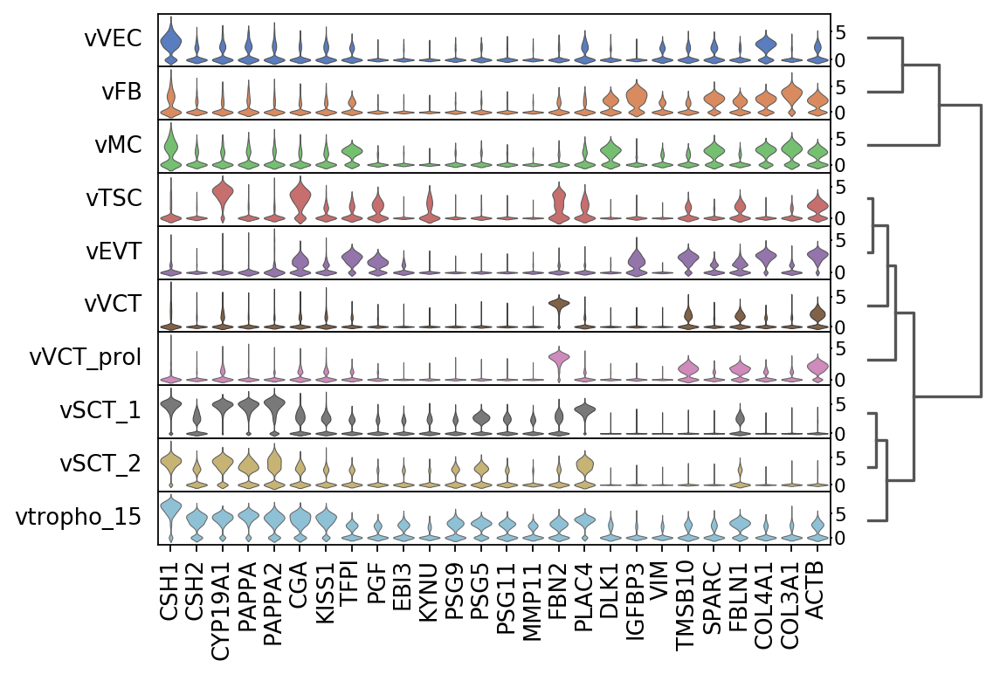

In [43]:
#Plot SCT plus stromal genes: 
sc.pl.stacked_violin(adata_villi_norm, custom_genes, 'cell_type_semifinal_v2', dendrogram=True)

#We see that vSCTjuv (vtropho_15) is clustered with the native vSCT_1 & vSCT2 populations. 
#vVEC, vFB & vMC are clustered together. 

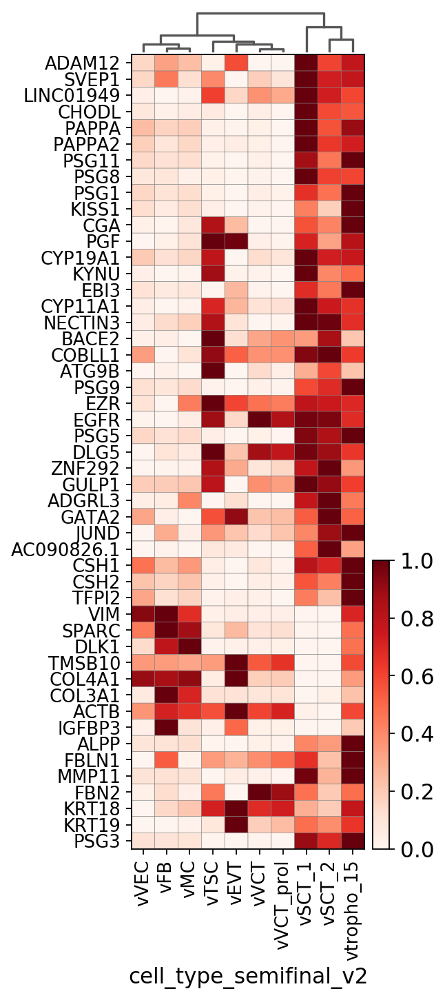

In [44]:
#Compute a matrixplot based on the gene expression of the following: 
#Also, reflects the heterogeneity within the SCT subpopulations. 
gene_list= ['ADAM12', 'SVEP1', 'LINC01949', 'CHODL', 'PAPPA', 'PAPPA2', 'PSG11', 'PSG8', 'PSG1', 
                'KISS1', 'CGA', 'PGF', 'CYP19A1', 'KYNU', 'EBI3', 
                'CYP11A1', 'NECTIN3', 'BACE2', 'COBLL1', 'ATG9B', 'PSG9', 'EZR', 'EGFR', 
                'PSG5', 'DLG5', 'ZNF292', 'GULP1', 'ADGRL3', 'GATA2', 'JUND', 'AC090826.1', 
                'CSH1', 'CSH2', 'TFPI2', 'VIM', 'SPARC', 'DLK1', 'TMSB10', 'COL4A1', 'COL3A1', 'ACTB', 'IGFBP3', 'ALPP', 
               'FBLN1', 'MMP11', 'FBN2', 'KRT18', 'KRT19', 'PSG3']

#Gene expression values are row-scaled. 
gs = sc.pl.matrixplot(adata_villi_norm, gene_list, groupby='cell_type_semifinal_v2', dendrogram=True,
                      use_raw=False, cmap= 'Reds', standard_scale='var', swap_axes=True, figsize=(3,10))

/home/debnatho/anaconda3/envs/hca_pancreas_paga/lib/python3.6/site-packages/anndata/core/anndata.py:846: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


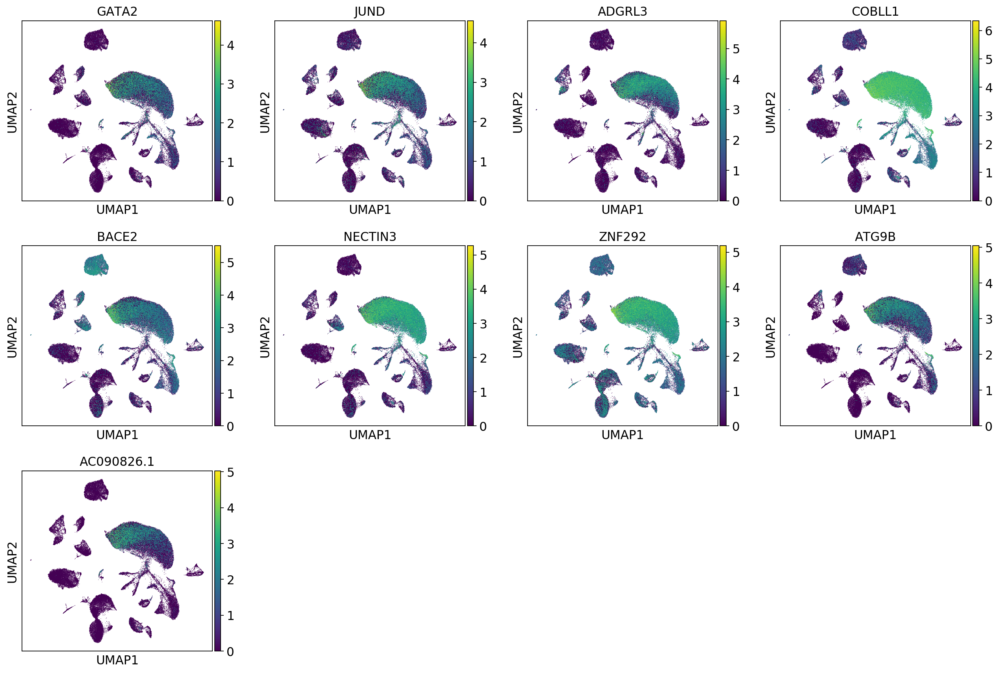

In [45]:
#Plot robust/specific vSCT2 genes: 
sc.pl.umap(adata_norm_umap, color= ['GATA2', 'JUND', 'ADGRL3', 'COBLL1', 'BACE2', 'NECTIN3', 'ZNF292', 'ATG9B', 'AC090826.1'])

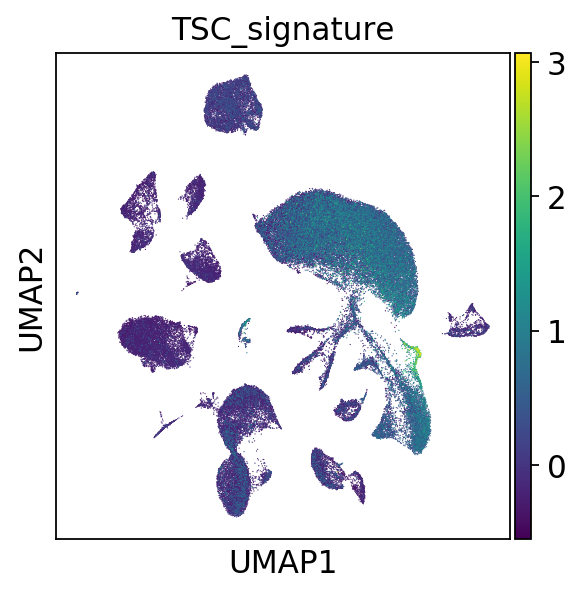

In [46]:
#Module score for vTSC (trophoblast stem cells):   
tsc_genes= ['GATA3', 'GREM2', 'ERVFRD-1', 'ESRRG']

sc.tl.score_genes(adata_norm_umap, tsc_genes, score_name= 'TSC_signature')
sc.pl.umap(adata_norm_umap, color= ['TSC_signature'])

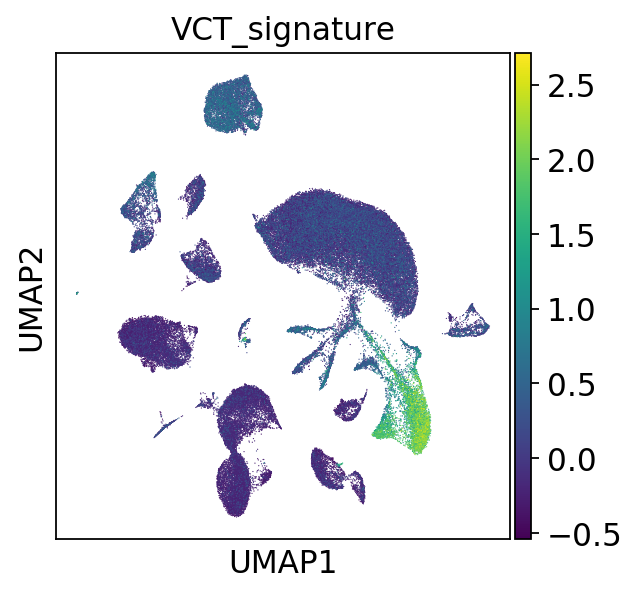

In [48]:
#Module score for vVCT (cytotrophoblast):   
vct_genes= ['TP63', 'PEG10', 'KANK1', 'LGR5', 'LGR4', 'YAP1', 'TEAD1']

sc.tl.score_genes(adata_norm_umap, vct_genes, score_name= 'VCT_signature')
sc.pl.umap(adata_norm_umap, color= ['VCT_signature'])

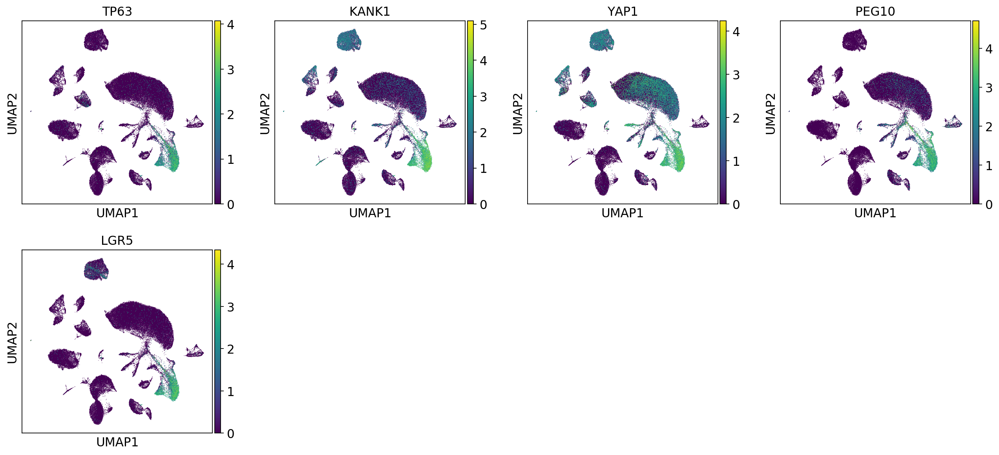

In [49]:
#Plot VCT genes individually:
#Plot TOP2A & MKI67 as proliferation markers characterizing vVCTprol: 
sc.pl.umap(adata_norm_umap, color= ['TP63', 'KANK1', 'YAP1', 'PEG10', 'LGR5'])

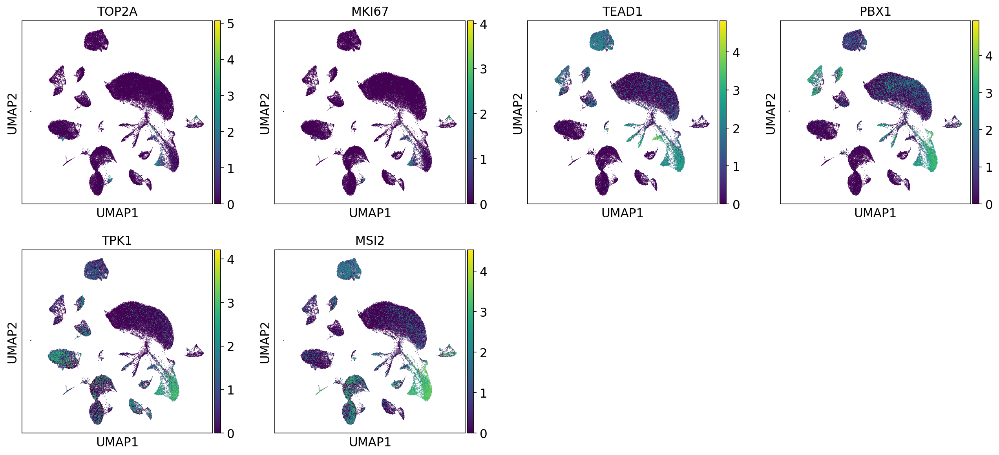

In [50]:
sc.pl.umap(adata_norm_umap, color= ['TOP2A', 'MKI67', 'TEAD1', 'PBX1', 'TPK1', 'MSI2'])

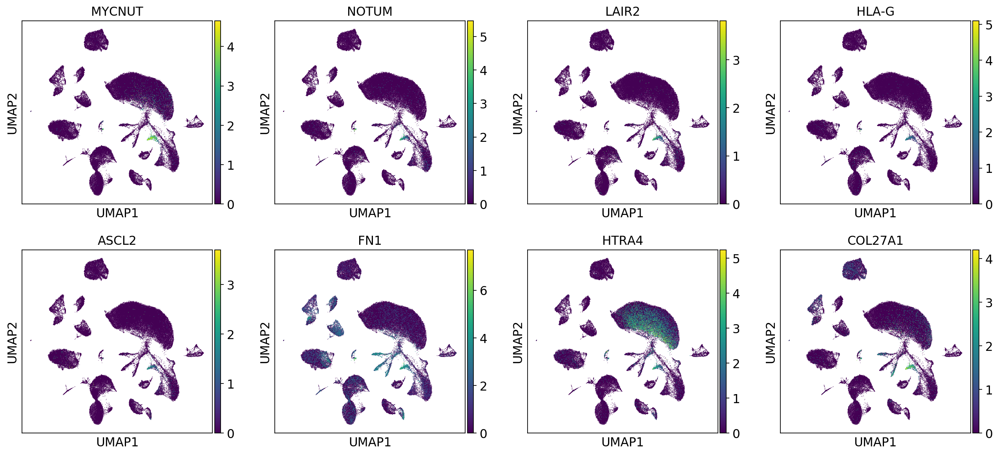

In [51]:
#Plot prominent EVT genes: 
sc.pl.umap(adata_norm_umap, color= ['MYCNUT', 'NOTUM', 'LAIR2', 'HLA-G', 'ASCL2', 'FN1', 'HTRA4', 'COL27A1'])

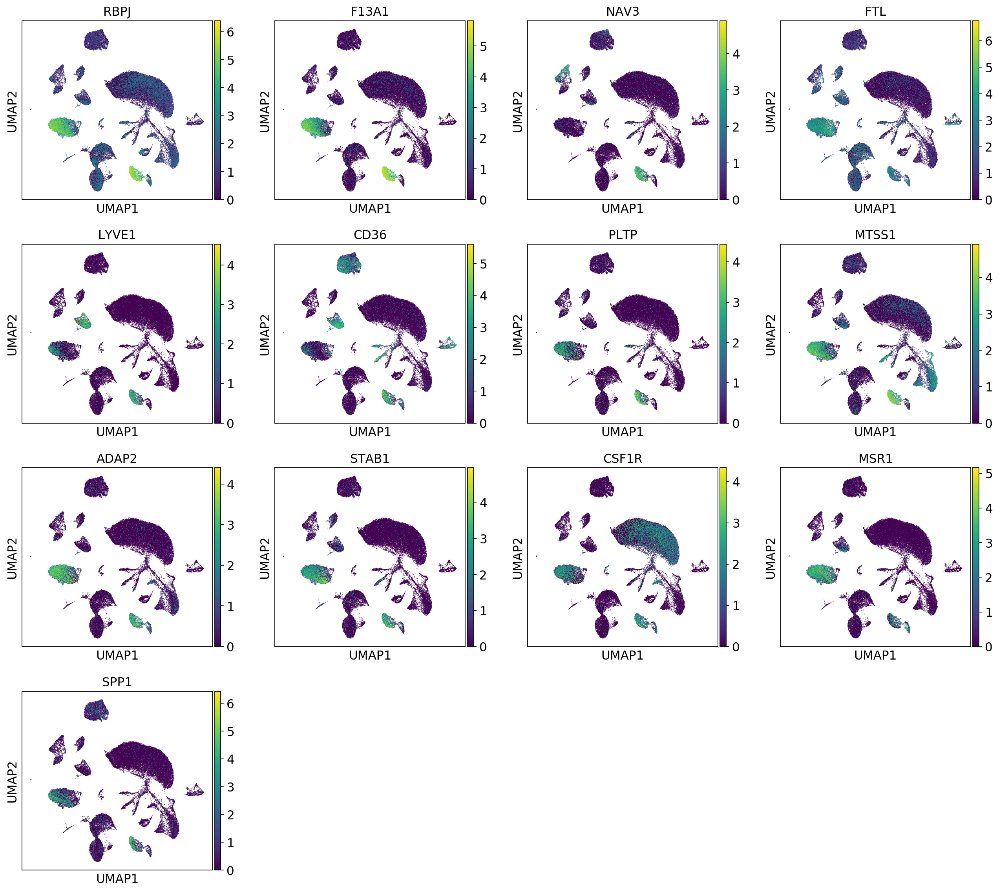

In [52]:
#Plot prominent vHBC genes: hoffbauer cells are analogous to decidual macrophages. 
sc.pl.umap(adata_norm_umap, color= ['RBPJ', 'F13A1', 'NAV3', 'FTL', 'LYVE1', 'CD36', 'PLTP', 'MTSS1', 'ADAP2', 'STAB1',
                                   'CSF1R', 'MSR1', 'SPP1'])

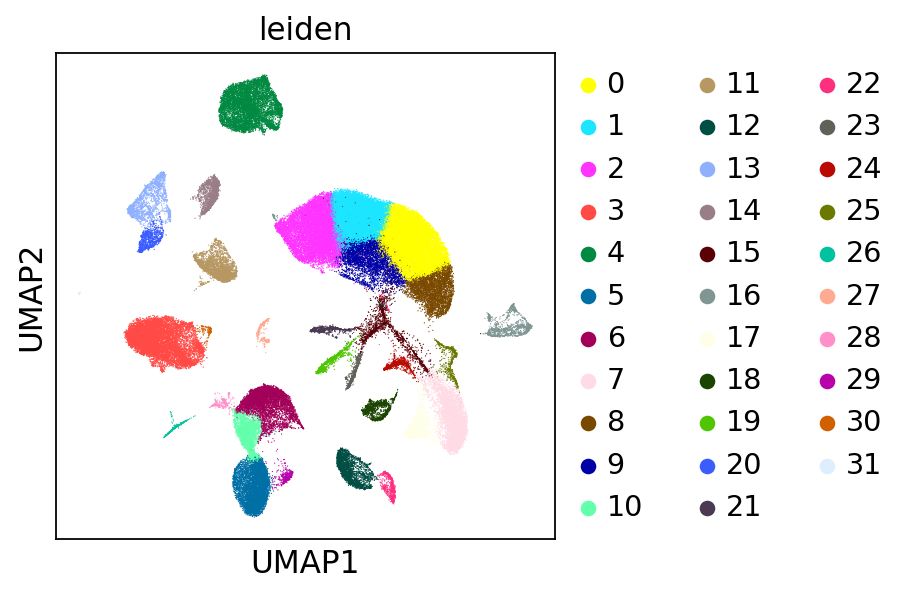

In [53]:
#Compute Leiden clustering:
adata_leiden= adata_int.copy()

sc.tl.leiden(adata_leiden)
sc.pl.umap(adata_leiden, color= ['leiden'])

In [54]:
#Check consistency with our final cluster annotations: 
#highly agreeable/consistent 
pd.crosstab(adata_leiden.obs['cell_type_semifinal_v2'], adata_leiden.obs['leiden'])

#Here, Cluster31 (=64 cells) is 'Unclassified'. This cluster is removed from all analysis as they lack specific markers. 

leiden,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
cell_type_semifinal_v2,,,,,,,,,,,,,,,,,,,,,
DSC_1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DSC_2,0,0,0,0,0,1,13,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Unclassified_35,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,64
dDC,0,0,0,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,173,0
dEVT,0,0,0,0,0,0,2,0,0,0,...,0,0,0,0,0,131,1,0,0,0
dEpC,0,0,1,1,7062,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
dFB_1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
dFB_2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
dGranulocyte,0,0,0,2,1,1,3,0,0,0,...,0,0,0,0,0,0,342,0,0,0


In [55]:
pd.crosstab(adata_leiden.obs['cell_type_semifinal_v2'], adata_leiden.obs['leiden']).to_csv('Leiden_consistency_check.csv')

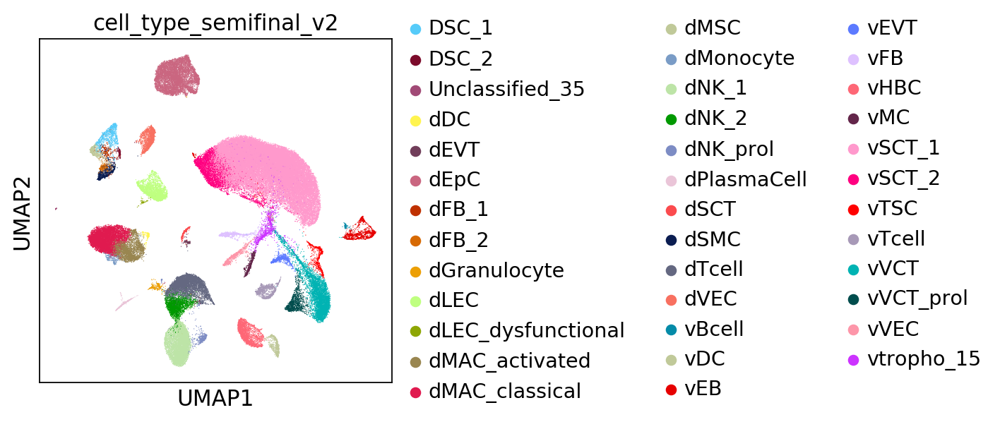

In [59]:
sc.pl.umap(adata_leiden, color= ['cell_type_semifinal_v2']) #annotation primarily done in Seurat & transferred to scanpy. 

In [60]:
#final anndata: results= "./placenta_umap_reproduced/Placenta_integrated_scanpy_umap.h5ad"